## Import notebook dependent packages and appropriate extensions

In [1]:
import torch
from skimage.restoration import unwrap_phase, denoise_tv_chambolle
import numpy as np
import tifffile as tif
import matplotlib.pyplot as plt
from matplotlib import colors
import sys, time
from scipy import ndimage
from scipy.fftpack import *
from scipy.signal import fftconvolve
import scipy.constants as physcon
import fabio

from torch.cuda import get_device_name
print("GPU:", get_device_name(0))

GPU: Tesla M10


In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"

## Import Dataset

In [3]:
exp_data = fabio.open("/home/ktrujillo/Lorentz/Kayna/ALTEM/2023_02_07/Cr2_Py16_Cr2/TFS/TIE/500_nano/aligned_imgj/unflip/crop_UF_full_aligned.tif")

## Setting up the Object

In [5]:
# Dimensions of object:
Nz = 11 # number of images in stack
Ny = 2400   # length of y-axis
Nx = 2400   # length of x-axis
d_pix = 2.314 # nm/pixel

A_samples = np.zeros([Nz, Ny, Nx])
print("A_samples is of type:", type(A_samples))
print("A_samples is of shape:", A_samples.shape)    # verify the array

# Crop image to area of interest by setting the appropriate conditions
# .data[Ny, Nx] configuration

# for ii in range(Nz):
#     A_samples[ii] = exp_data.getframe(ii).data[600:3000, 820:3220]

# cropped data
for ii in range(Nz):
    A_samples[ii] = exp_data.getframe(ii).data

# Convert intensity measurements to amplitude (take the root)
A_samples = np.sqrt(A_samples)

# "/=" == "a/=4" == a=a/4
# A_samples /= A_samples.mean(1).mean(1); axis = 0: collapse rows, 1: collapse columns
A_samples /= A_samples.mean(1).mean(1)[:,np.newaxis,np.newaxis]

A_samples is of type: <class 'numpy.ndarray'>
A_samples is of shape: (11, 2400, 2400)


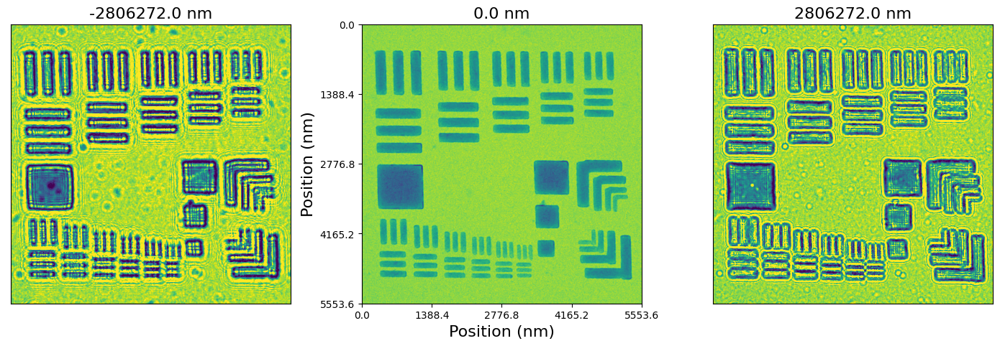

In [13]:
# Set the defocus values 
defocus = np.array([-2806272.0, -1603584.0, -815616.0, -400896.0, -202752.0, 0.0, 202752.0, 400896.0, 815616.0, 1603584.0, 2806272.0])
# defocus = np.array([-1440000,-1210000,-1000000,-810000,-640000,-490000,-360000, -250000,-160000,-90000,-40000,-10000,0,\ 10000,40000,90000,160000,250000,360000,490000,640000,810000,1000000,1210000,1440000])

# Configure the plots (Maximum UF >>> IF >>> Maximum OF)
f, ax = plt.subplots(ncols=3, figsize = (14,8))
ax[0].imshow(A_samples[0], cmap='viridis', norm=colors.Normalize(A_samples[5].min(), A_samples[5].max()))
ax[0].set_title("{0} nm".format(defocus[0]))
ax[1].imshow(A_samples[5], cmap='viridis', norm=colors.Normalize(A_samples[5].min(), A_samples[5].max()))
ax[1].set_title("{0} nm".format(defocus[5]))
ax[2].imshow(A_samples[-1], cmap='viridis', norm=colors.Normalize(A_samples[5].min(), A_samples[5].max()))
ax[2].set_title("{0} nm".format(defocus[-1]))


# Set scale ticks for x&y axes in nm scale
xticks = np.linspace(0, Nx, 5)
xticklabel = xticks*d_pix
yticks = np.linspace(0, Ny, 5)
yticklabel = yticks*d_pix

#-------
ax[0].set_xticks([])
ax[0].set_xticklabels("")
ax[0].set_yticks([])
ax[0].set_yticklabels("")

ax[1].set_xticks(xticks)
ax[1].set_xticklabels(xticklabel)
ax[1].set_yticks(yticks)
ax[1].set_yticklabels(yticklabel)
ax[1].set_ylabel("Position (nm)")
ax[1].set_xlabel("Position (nm)")
plt.rc("axes", labelsize=16, titlesize=16)
plt.rc("xtick", labelsize=14)
plt.rc("ytick", labelsize=14)


ax[2].set_xticks([])
ax[2].set_xticklabels('')
ax[2].set_yticks([])
ax[2].set_yticklabels("")

f.tight_layout()



## Microscope Transfer Function

### Object & Mesh Dimensions

In [16]:
# Dimensions of the dataset are reciprocal space (q) dimensions
[q_dim, q_dim] = A_samples[5].shape

# Dimensions of real space (r) dimensions
r_dim = q_dim / 2
print("RECIPROCAL space is:", q_dim, "and REAL space is:", r_dim)

line = np.arange(q_dim) - float(r_dim)
[X, Y] = np.meshgrid(line, line)
qq = torch.tensor(np.sqrt(X**2 + Y**2) / float(q_dim),
                    dtype = torch.float32,
                    requires_grad = True,
                    device = device)

RECIPROCAL space is: 2400 and REAL space is: 1200.0


### Independent Microscope Variables
*pulled from metadata*

In [17]:
d_pix = 2.314    # nm / pix
E = 200e3   # kV
Cs = 1.0e6  # 
Cc = 5.0e6  # 
Ca = 0.0e6  # 
phi_a = 0   # 
def_spr = 120   # 

# e: elementary charge
# m_e: electron mass
# c: speed of light in vacuum
# h: Plancks constant

epsilon = 0.5 * physcon.e / physcon.m_e / physcon.c**2
lam = physcon.h * 1.0e9 / np.sqrt(2.0 * physcon.m_e * physcon.e) / np.sqrt(E + epsilon * E**2)
gamma = 1.0 + physcon.e * E / physcon.m_e / physcon.c**2
sigma = 2.0 * np.pi * physcon.m_e * gamma * physcon.e * lam * 1.0e-18 / physcon.h**2

scale1 = 1
scale2 = 100


In [9]:
# Arrays for Analyzing Parameters

# enumerate
# for loops
# dictionaries
# tuples
    

In [18]:
lam = lam / d_pix
cs = Cs / d_pix
ca = Ca / d_pix
phi = 0
spread = def_spr / d_pix

In [19]:
def getTF(defoc, theta_c):

  def_val = defoc * scale1 / d_pix

  theta_c = torch.pow(10, theta_c/scale2)

  p1 = np.pi * lam * (def_val + ca * np.cos(2.0 * (phi - phi_a))) # tensor
  p2 = np.pi * cs * lam**3 * 0.5 
  p3 = 2.0 * (np.pi * theta_c * spread)**2  # a tensor
  p4 = (np.pi * lam * spread)**2
  p5 = np.pi**2 * theta_c**2 / lam**2  # a tensor
  p6 = cs * lam**3   
  p7 = def_val * lam  # a tensor
 
  u = 1.0 + p3 * qq**2 
  chiq = -p1 * qq**2 + p2 * qq**4  
  es_arg = 1.0/(2.0*u) * p4 * qq**4   
  et_arg = torch.multiply(1.0/u, torch.multiply(p5, (p6 * qq**3 - torch.multiply(p7,qq) )**2 ) )  # a tensor

  dampenv = torch.exp(es_arg-et_arg)   # a tensor
  transfer_function = torch.fft.fftshift(torch.multiply(torch.complex(torch.cos(chiq),-torch.sin(chiq)), dampenv), dim=(1,2))
  
  return transfer_function

In [20]:
def compute_loss():
  tf_obj = guess_amplitude * torch.exp(1j*guess_phase)
  cal_data = torch.fft.ifft2(torch.fft.fft2(tf_obj)*getTF(defoc, theta_c))
  cal_data = torch.abs(cal_data)
  cal_data /= torch.mean(cal_data, dim=(1,2), keepdims=True)

  return torch.mean((cal_data - exp_data)**2)

In [21]:
def training_loop(optimizer, n=5000):
    "Training loop for torch model."
    losses = []
    for i in range(n):
        loss = compute_loss()
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        losses.append(loss.cpu().detach().numpy())  
        if i>0 and not i%10000:
          print(loss, theta_c)
    return losses
    

In [22]:
selection = [0, 2, 5, -3, -1]
# selection = [2,5,19,22]
print("chosen defocus (mm): ", defocus[selection]/1e6)

exp_data = torch.from_numpy(A_samples[selection].astype(np.float32)).to(device)

# initialize the amplitude as the square root of the on focus image intensity, the optimal weight is known for simulated data, and is estimated for exp data
guess_amplitude = torch.tensor(denoise_tv_chambolle(A_samples[5], weight=0.025, channel_axis=False), dtype=torch.float32, requires_grad=False, device=device)
# initialize the phase as 0.5 everywhere
guess_phase = torch.tensor(np.zeros(A_samples[5].shape)+0.5, dtype=torch.float32, requires_grad=True, device=device) 
print(guess_phase.type(), guess_phase.dtype)

defoc = torch.tensor(defocus[selection][:, np.newaxis, np.newaxis]/scale1, dtype=torch.float32, requires_grad=False, device=device)
theta_c = torch.tensor(-500, dtype=torch.float32, requires_grad=False, device=device) 

opt = torch.optim.Adam([guess_phase], lr=.025)

chosen defocus (mm):  [-2.806272 -0.815616  0.        0.815616  2.806272]
torch.cuda.FloatTensor torch.float32


In [23]:
losses = training_loop(opt, n= 5000)#200000)

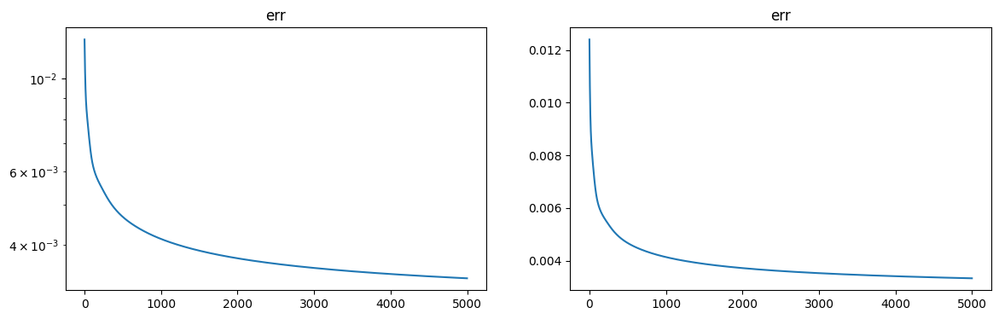

In [24]:
f, ax = plt.subplots(ncols=2, figsize = (14,4))
ax[0].semilogy(losses)
ax[0].set_title("err")
ax[1].plot(losses)
ax[1].set_title("err");


In [25]:
result_phase = guess_phase.cpu().detach().numpy()
result_phase -= result_phase.mean()

In [16]:
def show_im(
    image,
    title=None,
    simple=False,
    origin="upper",
    cbar=True,
    cbar_title="",
    scale=None,
    **kwargs,
):
    """Display an image on a new axis.

    Takes a 2D array and displays the image in grayscale with optional title on
    a new axis. In general it's nice to have things on their own axes, but if
    too many are open it's a good idea to close with plt.close('all').

    Args:
        image (2D array): Image to be displayed.
        title (str): (`optional`) Title of plot.
        simple (bool): (`optional`) Default output or additional labels.

            - True, will just show image.
            - False, (default) will show a colorbar with axes labels, and will adjust the
              contrast range for images with a very small range of values (<1e-12).

        origin (str): (`optional`) Control image orientation.

            - 'upper': (default) (0,0) in upper left corner, y-axis goes down.
            - 'lower': (0,0) in lower left corner, y-axis goes up.

        cbar (bool): (`optional`) Choose to display the colorbar or not. Only matters when
            simple = False.
        cbar_title (str): (`optional`) Title attached to the colorbar (indicating the
            units or significance of the values).
        scale (float): Scale of image in nm/pixel. Axis markers will be given in
            units of nanometers.

    Returns:
        None
    """
    fig, ax = plt.subplots()
    if not simple and np.max(image) - np.min(image) < 1e-12:
        # adjust coontrast range
        vmin = np.min(image) - 1e-12
        vmax = np.max(image) + 1e-12
        im = ax.matshow(image, cmap="gray", origin=origin, vmin=vmin, vmax=vmax)
    else:
        im = ax.matshow(image, cmap="gray", origin=origin, **kwargs)

    if title is not None:
        ax.set_title(str(title), pad=0)

    if simple:
        plt.axis("off")
    else:
        plt.tick_params(axis="x", top=False)
        ax.xaxis.tick_bottom()
        ax.tick_params(direction="in")
        if scale is None:
            ticks_label = "pixels"
        else:

            def mjrFormatter(x, pos):
                return f"{scale*x:.3g}"

            fov = scale * max(image.shape[0], image.shape[1])

            if fov < 4e3:  # if fov < 4um use nm scale
                ticks_label = " nm "
            elif fov > 4e6:  # if fov > 4mm use m scale
                ticks_label = "  m  "
                scale /= 1e9
            else:  # if fov between the two, use um
                ticks_label = " $\mu$m "
                scale /= 1e3

            ax.yaxis.set_major_formatter(mpl.ticker.FuncFormatter(mjrFormatter))
            ax.xaxis.set_major_formatter(mpl.ticker.FuncFormatter(mjrFormatter))

        if origin == "lower":
            ax.text(y=0, x=0, s=ticks_label, rotation=-45, va="top", ha="right")
        elif origin == "upper":  # keep label in lower left corner
            ax.text(
                y=image.shape[0], x=0, s=ticks_label, rotation=-45, va="top", ha="right"
            )

        if cbar:
            plt.colorbar(im, ax=ax, pad=0.02, format="%.2g", label=str(cbar_title))

    plt.show()
    return


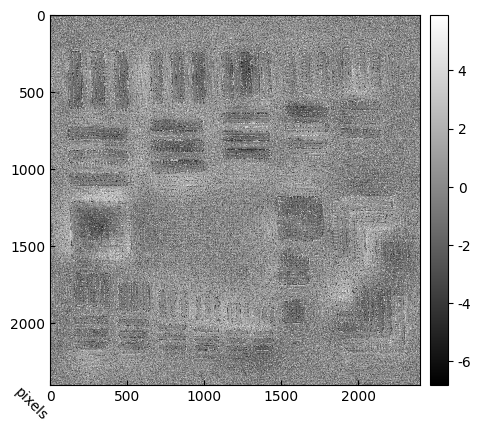

In [55]:
show_im(result_phase)

from tifffile import imwrite
import numpy as np

imwrite("/home/ktrujillo/Lorentz/Kayna/ALTEM/2023_02_07/Cr2_Py16_Cr2/TFS/TIE/500_nano/aligned_imgj/data_analysis_crop_2405_2404/AD_Phase_RAW.tiff", result_phase)

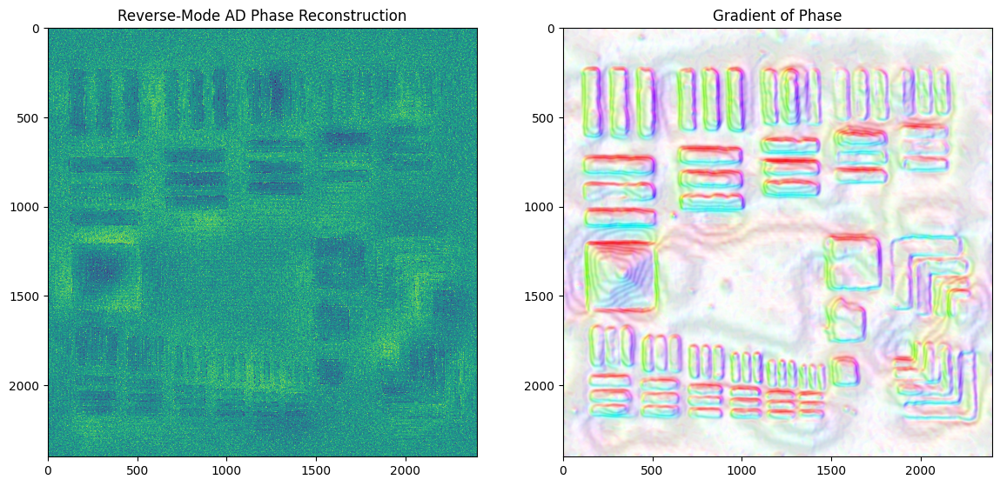

In [31]:
from microscopes_fwd import Plot_ColorMap
# show phase gradient
f, ax = plt.subplots(ncols=2, figsize = (14,8))

ax[0].imshow(result_phase, interpolation='none', cmap='viridis')
ax[0].set_title("Reverse-Mode AD Phase Reconstruction")


t2 = np.copy(result_phase)
t2=ndimage.gaussian_filter(t2-np.mean(t2),10,order=0)
gx=np.gradient(t2,axis=0)
gy=np.gradient(t2,axis=1)
rgb_map=Plot_ColorMap(Bx=gx, By=gy, hsvwheel=True)
ax[1].imshow(rgb_map)
ax[1].imshow(np.cos(t2*10), cmap='gray', alpha=0.1, vmin=-1, vmax=1)
ax[1].set_title("Gradient of Phase");


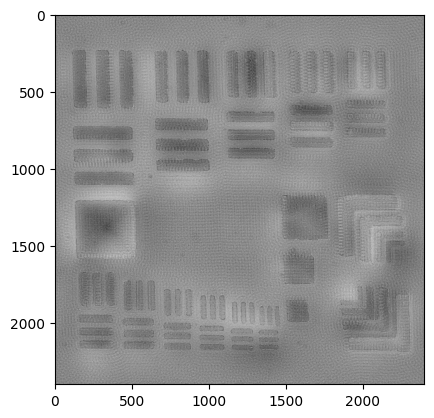

In [17]:
from skimage import io
p = io.imread("/home/ktrujillo/Lorentz/Kayna/ALTEM/2023_02_07/Cr2_Py16_Cr2/TFS/TIE/500_nano/aligned_imgj/data_analysis_crop_2405_2404/AD_Phase_RAW.tiff")

#show_im(p)
# plt.imshow(p, cmap="gray")

In [18]:
# p = result_phase
def get_fft(im):
    """
    Get FFT of 2D image
    """
    return np.fft.fftshift(np.fft.fft2(im))

fftp = get_fft(p)


# FILTERED DATA


## Lowest Frequency
- Low Frequency = 500
- High Frequency = 250

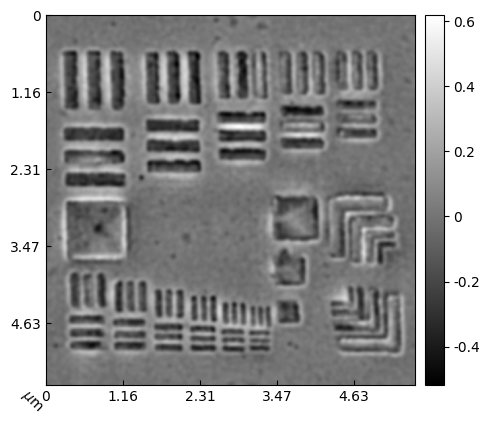

In [19]:
import matplotlib as mpl
d_pix=2.314 #nm/pix
def get_ifft(fft):
    """Get inverse fast fourier transform of 2D image"""
    return np.fft.ifft2(np.fft.ifftshift(fft))

filter_lf = 500 #2500 # nm
filter_hf = 250 # nm

dim_y, dim_x = p.shape

x_sampling = y_sampling = 1 / d_pix  # [pixels/nm]
u_max = x_sampling / 2
v_max = y_sampling / 2
u_axis_vec = np.linspace(-u_max / 2, u_max / 2, dim_x)
v_axis_vec = np.linspace(-v_max / 2, v_max / 2, dim_y)
u_mat, v_mat = np.meshgrid(u_axis_vec, v_axis_vec)
r = np.sqrt(u_mat**2 + v_mat**2)  # nm

if filter_lf is not None:
    inverse_gauss_filter = 1 - np.exp(-1 * (r * filter_lf) ** 2)
else:
    inverse_gauss_filter = np.ones_like(r)
if filter_hf is not None:
    gauss_filter = np.exp(-1 * (r * filter_hf) ** 2)
else:
    gauss_filter = np.ones_like(r)
bp_filter = inverse_gauss_filter * gauss_filter

bp_fftp = fftp*bp_filter
kp = get_ifft(bp_fftp).real

show_im(kp, scale=d_pix)
#imwrite("/home/ktrujillo/Lorentz/Kayna/ALTEM/2023_02_07/Cr2_Py16_Cr2/TFS/TIE/500_nano/aligned_imgj/data_analysis_crop_2405_2404/AD_Phase_LF500_HF250.tiff", kp)

In [20]:
from matplotlib.pyplot import xticks
from mpl_toolkits.axes_grid1 import make_axes_locatable
from microscopes_fwd import Plot_ColorMap
from matplotlib import gridspec


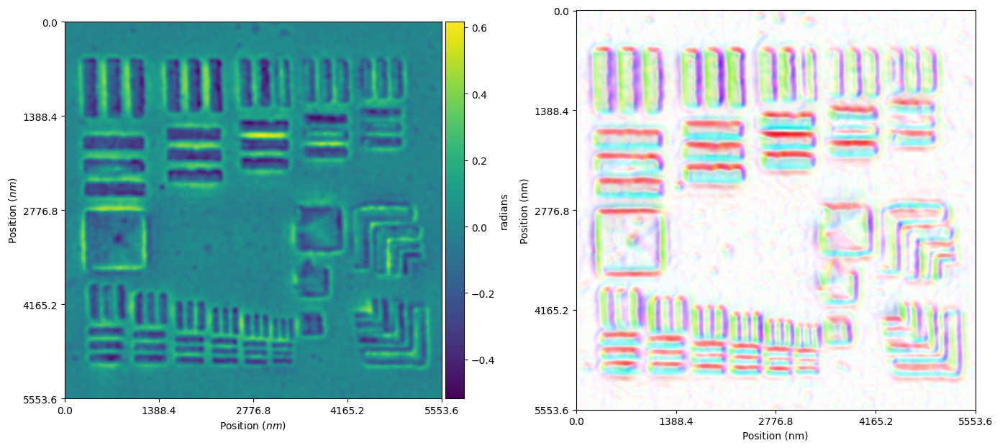

In [91]:
# Set scale ticks for x&y axes in nm scale
xticks = np.linspace(0, Nx, 5)
xticklabel = xticks*d_pix
yticks = np.linspace(0, Ny, 5)
yticklabel = yticks*d_pix


# show phase gradient
f, ax = plt.subplots(ncols=2, figsize = (14,8))
# gs: GridSpec = gridspec.GridSpec(2,1, width_ratios=[14,8])

ax[0].imshow(kp, interpolation='none', cmap='viridis')
ax[0].set_title("Reverse-Mode AD Total Phase Reconstruction")
ax[0].set_xlabel("Position ($nm$)")
ax[0].set_ylabel("Position ($nm$)")


# ----

t2 = np.copy(kp)
t2=ndimage.gaussian_filter(t2-np.mean(t2),10,order=0)
gx=np.gradient(t2,axis=0)
gy=np.gradient(t2,axis=1)
rgb_map=Plot_ColorMap(Bx=gx, By=gy, hsvwheel=True)
ax[1].imshow(rgb_map)
ax[1].imshow(np.cos(t2*10), cmap='gray', alpha=0.1, vmin=-1, vmax=1)
ax[1].set_title("Magnetic Induction as Gradient of Total Phase");
ax[1].set_xlabel("Position (nm)")
ax[1].set_ylabel("Position (nm)")

#-------
ax[0].set_xticks(xticks)
ax[0].set_xticklabels(xticklabel)
ax[0].set_yticks(yticks)
ax[0].set_yticklabels(yticklabel)

ax[1].set_xticks(xticks)
ax[1].set_xticklabels(xticklabel)
ax[1].set_yticks(yticks)
ax[1].set_yticklabels(yticklabel)

# ----
# Build your secondary mirror axes:
# f2, (ax3) = plt.subplots()

# Build maps that parallel the color-coded data
# NOTE 1: imshow requires a 2-D array as input
# NOTE 2: You must use the same cmap tag as above for it match
map1 = ax3.imshow(kp, interpolation="none", cmap='viridis')

div = make_axes_locatable(ax[0])
cax = div.append_axes(position="right", size="5%", pad=0.05)


# Add your maps onto your original figure/axes
f.colorbar(map1, cax=cax, label="radians")
f.tight_layout()

# f.colorbar(map1, ax=ax[0], pad=0.02, format="%.2g", label="radians")
# plt.show()


### TIE without qc filter -- TIE RAW

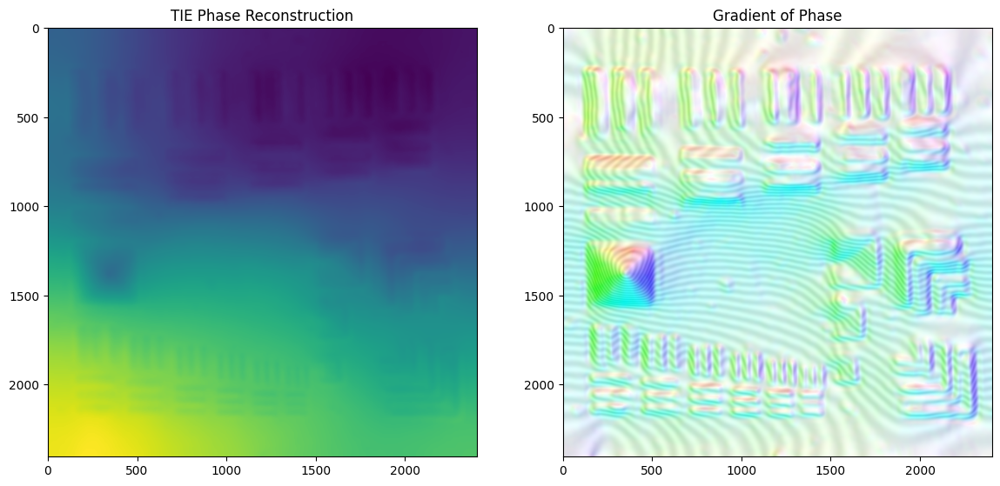

In [34]:
from skimage import io

# read image stack
tie = io.imread("/home/ktrujillo/Lorentz/Kayna/ALTEM/2023_02_07/Cr2_Py16_Cr2/TFS/TIE/500_nano/aligned_imgj/data_analysis_crop_2405_2404/TIE_Phase_qcnone.tiff")

# # show image 
# plt.imshow(tie, cmap="gray")

from microscopes_fwd import Plot_ColorMap

# show phase gradient
f, ax = plt.subplots(ncols=2, figsize = (14,8))

ax[0].imshow(tie, interpolation='none', cmap='viridis')
ax[0].set_title("TIE Phase Reconstruction")


t2 = np.copy(tie)
t2=ndimage.gaussian_filter(t2-np.mean(t2),10,order=0)
gx=np.gradient(t2,axis=0)
gy=np.gradient(t2,axis=1)
rgb_map=Plot_ColorMap(Bx=gx, By=gy, hsvwheel=True)
ax[1].imshow(rgb_map)
ax[1].imshow(np.cos(t2*10), cmap='gray', alpha=0.1, vmin=-1, vmax=1)
ax[1].set_title("Gradient of Phase");

### TIE WITHOUT "qc" WITH LOW/HIGH Frequency Filter

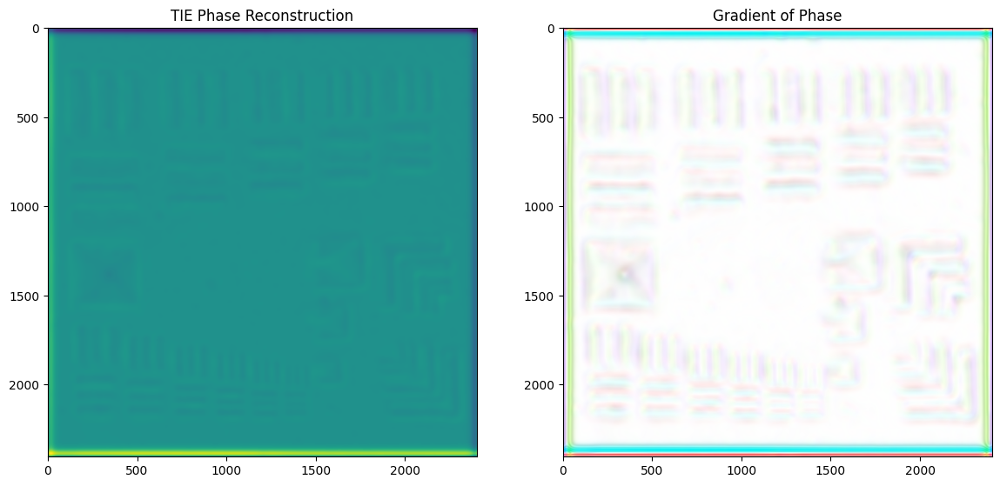

In [35]:
from skimage import io

# read image stack
tie = io.imread("/home/ktrujillo/Lorentz/Kayna/ALTEM/2023_02_07/Cr2_Py16_Cr2/TFS/TIE/500_nano/aligned_imgj/data_analysis_crop_2405_2404/TIE_Phase_qcnone_LF500_HF250.tiff")

# # show image 
# plt.imshow(tie, cmap="gray")

from microscopes_fwd import Plot_ColorMap

# show phase gradient
f, ax = plt.subplots(ncols=2, figsize = (14,8))

ax[0].imshow(tie, interpolation='none', cmap='viridis')
ax[0].set_title("TIE Phase Reconstruction")


t2 = np.copy(tie)
t2=ndimage.gaussian_filter(t2-np.mean(t2),10,order=0)
gx=np.gradient(t2,axis=0)
gy=np.gradient(t2,axis=1)
rgb_map=Plot_ColorMap(Bx=gx, By=gy, hsvwheel=True)
ax[1].imshow(rgb_map)
ax[1].imshow(np.cos(t2*10), cmap='gray', alpha=0.1, vmin=-1, vmax=1)
ax[1].set_title("Gradient of Phase");

### TIE with qc=0.001 and zero Frequency Filter


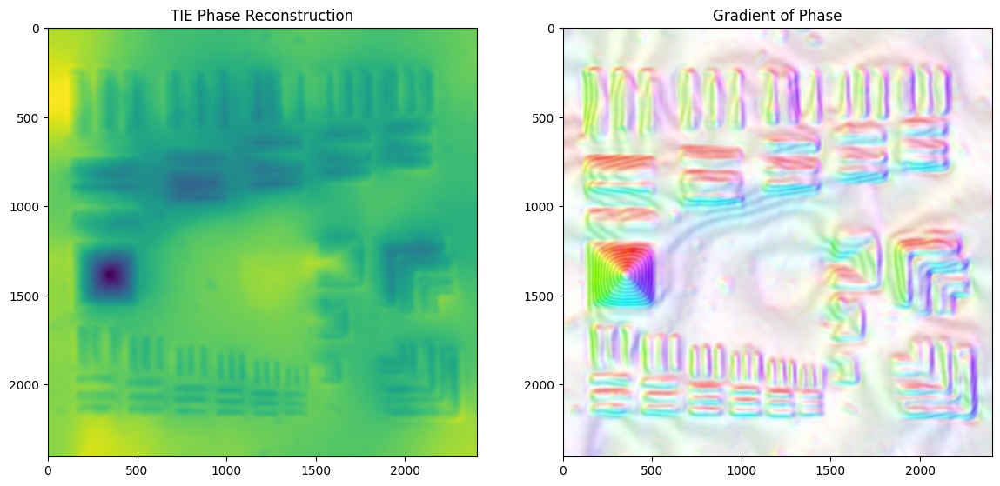

In [59]:
from skimage import io

# read image stack
tie = io.imread("/home/ktrujillo/Lorentz/Kayna/ALTEM/2023_02_07/Cr2_Py16_Cr2/TFS/TIE/500_nano/aligned_imgj/data_analysis_crop_2405_2404/TIE_Phase_qc0.001.tiff")

# # show image 
# plt.imshow(tie, cmap="gray")

from microscopes_fwd import Plot_ColorMap

# show phase gradient
f, ax = plt.subplots(ncols=2, figsize = (14,8))

ax[0].imshow(tie, interpolation='none', cmap='viridis')
ax[0].set_title("TIE Phase Reconstruction")


t2 = np.copy(tie)
t2=ndimage.gaussian_filter(t2-np.mean(t2),10,order=0)
gx=np.gradient(t2,axis=0)
gy=np.gradient(t2,axis=1)
rgb_map=Plot_ColorMap(Bx=gx, By=gy, hsvwheel=True)
ax[1].imshow(rgb_map)
ax[1].imshow(np.cos(t2*10), cmap='gray', alpha=0.1, vmin=-1, vmax=1)
ax[1].set_title("Gradient of Phase");

### TIE with qc = 0.001 and LH = 500, HF = 250

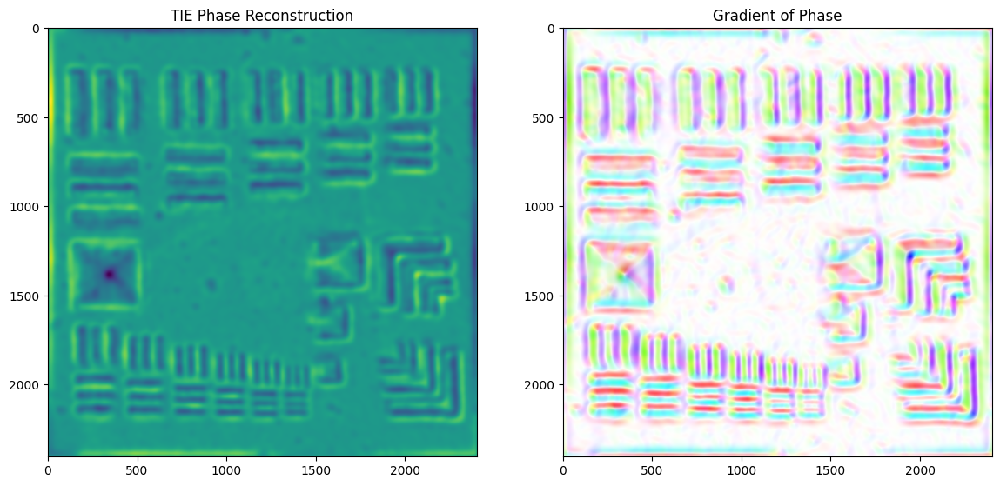

In [21]:
from skimage import io

# read image stack
tie = io.imread("/home/ktrujillo/Lorentz/Kayna/ALTEM/2023_02_07/Cr2_Py16_Cr2/TFS/TIE/500_nano/aligned_imgj/data_analysis_crop_2405_2404/TIE_Phase_qc0.0001_LF500_HF250.tiff")

# # show image 
# plt.imshow(tie, cmap="gray")

from microscopes_fwd import Plot_ColorMap

# show phase gradient
f, ax = plt.subplots(ncols=2, figsize = (14,8))

ax[0].imshow(tie, interpolation='none', cmap='viridis')
ax[0].set_title("TIE Phase Reconstruction")


t2 = np.copy(tie)
t2=ndimage.gaussian_filter(t2-np.mean(t2),10,order=0)
gx=np.gradient(t2,axis=0)
gy=np.gradient(t2,axis=1)
rgb_map=Plot_ColorMap(Bx=gx, By=gy, hsvwheel=True)
ax[1].imshow(rgb_map)
ax[1].imshow(np.cos(t2*10), cmap='gray', alpha=0.1, vmin=-1, vmax=1)
ax[1].set_title("Gradient of Phase");

# Direct Comparisons TIE:AD

In [29]:
Nz_tie = 11 # number of images in stack
Ny_tie = 2405   # length of y-axis TIE
Nx_tie = 2404   # length of x-axis TIE

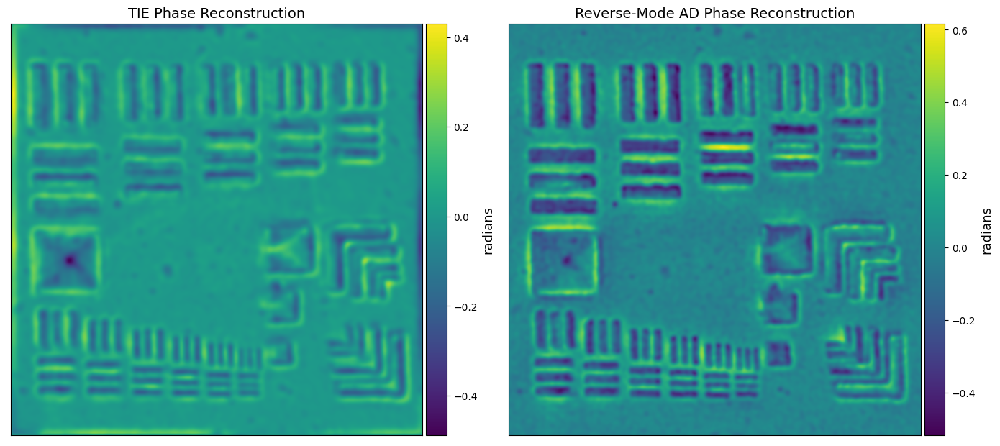

In [27]:
from matplotlib.colorbar import make_axes


f, ax = plt.subplots(ncols=2, figsize = (14,8))

# # Set x-y labels in nm for TIE
# xticks_tie = np.linspace(0, Nx_tie, 5)
# xticklabel_tie = xticks*d_pix
# yticks_tie = np.linspace(0, Ny_tie, 5)
# yticklabel_tie = yticks*d_pix


# # Set x-y labels in nm for AD
# xticks_ad = np.linspace(0, Nx, 5)
# xticklabel_ad = xticks*d_pix
# yticks_ad = np.linspace(0, Ny, 5)
# yticklabel_ad = yticks*d_pix

# Plot TIE Phase Reconstruction
ax[0].imshow(tie, interpolation='none', cmap='viridis')
ax[0].set_title("TIE Phase Reconstruction")
# ax[0].set_ylabel("Position (nm)")
# ax[0].set_xlabel("Position (nm)")


# Plot AD Phase Reconstruction
ax[1].imshow(kp, interpolation='none', cmap='viridis')
ax[1].set_title("Reverse-Mode AD Phase Reconstruction")
# ax[1].set_ylabel("Position (nm)")
# ax[1].set_xlabel("Position (nm)")

#-------
ax[0].set_xticks([])    # (xticks_tie)
# ax[0].set_xticklabels(xticklabel_tie)
ax[0].set_yticks([])    #(yticks_tie)
# ax[0].set_yticklabels(yticklabel_tie)

ax[1].set_xticks([])    #(xticks_ad)
# ax[1].set_xticklabels(xticklabel_ad)
ax[1].set_yticks([])    #(yticks_ad)
# ax[1].set_yticklabels(yticklabel_ad)

# ----
# Build maps that parallel the color-coded data
# NOTE 1: imshow requires a 2-D array as input
# NOTE 2: You must use the same cmap tag as above for it match


# Build your secondary mirror axes for TIE:
# f1, (ax3) = plt.subplots()
map_tie = ax3.imshow(tie, interpolation="none", cmap="viridis")
div_tie = make_axes_locatable(ax[0])
cax_tie = div_tie.append_axes(position="right", size="5%", pad=0.05)


# Build your secondary mirror axes for AD:
# f2, (ax4) = plt.subplots()
map_ad = ax4.imshow(kp, interpolation="none", cmap='viridis')
div_ad = make_axes_locatable(ax[1])
cax_ad = div_ad.append_axes(position="right", size="5%", pad=0.05)

# Add your maps onto your original figure/axes
f.colorbar(map_tie, cax=cax_tie, label="radians")
f.colorbar(map_ad, cax=cax_ad, label="radians")
f.tight_layout()

# f.colorbar(map1, ax=ax[0], pad=0.02, format="%.2g", label="radians")
# plt.show()

# plt.rc("axes", labelsize=12)
plt.rc("axes", titlesize = 14)
# plt.rc("xtick", labelsize=11)
# plt.rc("ytick", labelsize=11)


#plt.savefig("/home/ktrujillo/Lorentz/Kayna/ALTEM/2023_02_07/Cr2_Py16_Cr2/TFS/TIE/500_nano/aligned_imgj/data_analysis_crop_2405_2404/Phase_TIE_qc0.0001_LF500_HF250_AD_noaxes.png")

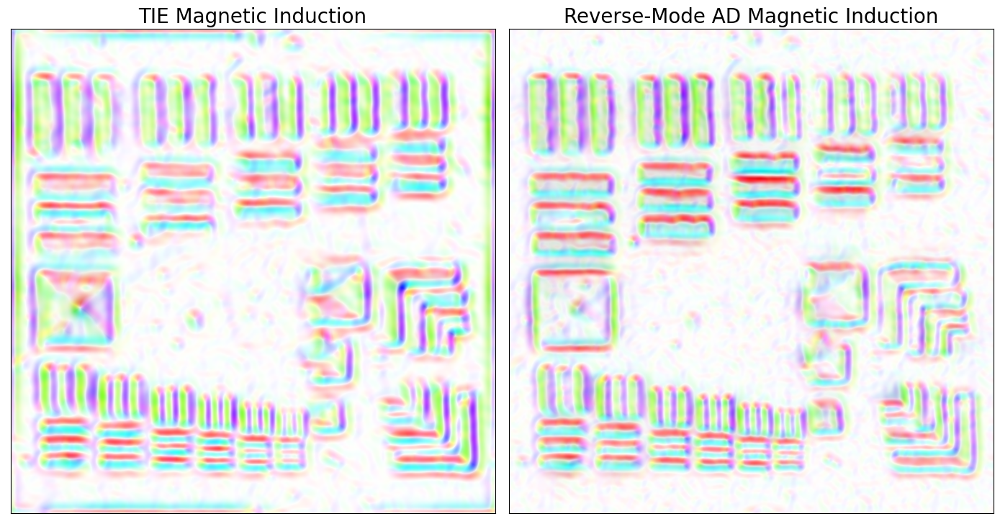

In [80]:
from microscopes_fwd import Plot_ColorMap

# show phase gradient
f, ax = plt.subplots(ncols=2, figsize = (14,8))

# Set x-y labels in nm for TIE
# xticks_tie = np.linspace(0, Nx_tie, 5)
# xticklabel_tie = xticks*d_pix
# yticks_tie = np.linspace(0, Ny_tie, 5)
# yticklabel_tie = yticks*d_pix


# Set x-y labels in nm for AD
# xticks_ad = np.linspace(0, Nx, 5)
# xticklabel_ad = xticks*d_pix
# yticks_ad = np.linspace(0, Ny, 5)
# yticklabel_ad = yticks*d_pix

# Plot the Phase Gradient TIE
t1 = np.copy(tie)
t1=ndimage.gaussian_filter(t1-np.mean(t1),10,order=0)
gx=np.gradient(t1,axis=0)
gy=np.gradient(t1,axis=1)
rgb_map=Plot_ColorMap(Bx=gx, By=gy, hsvwheel=True)
ax[0].imshow(rgb_map)
ax[0].imshow(np.cos(t1*10), cmap='gray', alpha=0.1, vmin=-1, vmax=1)
ax[0].set_title("TIE Magnetic Induction");
# ax[0].set_ylabel("Position (nm)")
# ax[0].set_xlabel("Position (nm)")

# Plot the Phase Gradient AD
t2 = np.copy(kp)
t2=ndimage.gaussian_filter(t2-np.mean(t2),10,order=0)
gx=np.gradient(t2,axis=0)
gy=np.gradient(t2,axis=1)
rgb_map=Plot_ColorMap(Bx=gx, By=gy, hsvwheel=True)
ax[1].imshow(rgb_map)
ax[1].imshow(np.cos(t2*10), cmap='gray', alpha=0.1, vmin=-1, vmax=1)
ax[1].set_title("Reverse-Mode AD Magnetic Induction");
# ax[1].set_ylabel("Position (nm)")
# ax[1].set_xlabel("Position (nm)");

#-------
ax[0].set_xticks([])#(xticks_tie)
# ax[0].set_xticklabels(xticklabel_tie)
ax[0].set_yticks([])#(yticks_tie)
# ax[0].set_yticklabels(yticklabel_tie)

ax[1].set_xticks([])#(xticks_ad)
# ax[1].set_xticklabels(xticklabel_ad)
ax[1].set_yticks([])#(yticks_ad)
# ax[1].set_yticklabels(yticklabel_ad)


# plt.rc("axes", labelsize=12)
plt.rc("axes", titlesize = 18)
# plt.rc("xtick", labelsize=11)
# plt.rc("ytick", labelsize=11)

f.tight_layout()


#plt.savefig("/home/ktrujillo/Lorentz/Kayna/ALTEM/2023_02_07/Cr2_Py16_Cr2/TFS/TIE/500_nano/aligned_imgj/data_analysis_crop_2405_2404/Grad_MagInd_TIE_qc0.0001_LF500_HF250_AD_noaxes.png")

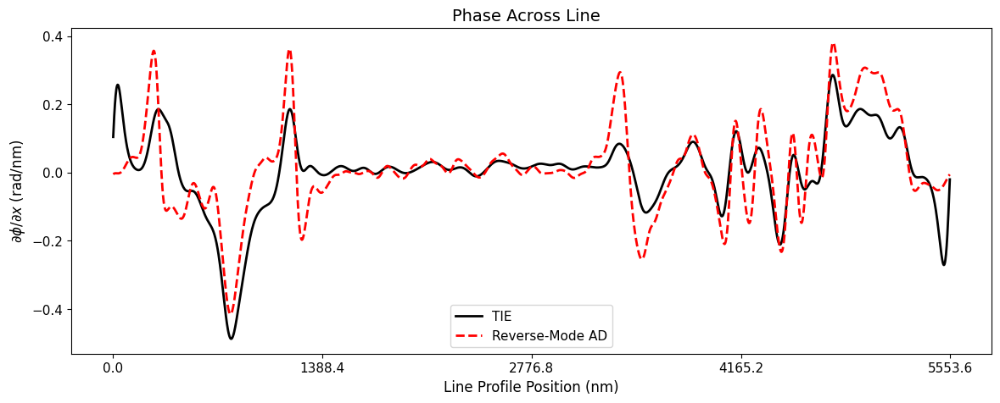

In [192]:
## along the x-direction across the two squares in the center

fig, ax = plt.subplots(figsize=(14,5))
ax.plot(tie[1383,4:2404], 'k-', linewidth=2, label="TIE")
ax.plot(kp[1388,0:2400], "r--", linewidth=2, label="Reverse-Mode AD") #610:1610,360], 'r--', linewidth=2)
ax.legend(loc="lower center")
ax.set_title("Phase Across Line  ")

ax.set_ylabel(r"$\partial\phi / \partial x$ (rad/nm)")
ax.set_xlabel("Line Profile Position (nm)")
plt.rc("axes", labelsize=12)
plt.rc("axes", titlesize = 14)
plt.rc("legend", fontsize=11)


xticks = np.linspace(0, Nx, 5)
xticklabel = xticks*d_pix

ax.set_xticks(xticks)
ax.set_xticklabels(xticklabel)


plt.savefig("/home/ktrujillo/Lorentz/Kayna/ALTEM/2023_02_07/Cr2_Py16_Cr2/TFS/TIE/500_nano/aligned_imgj/data_analysis_crop_2405_2404/0.0001_Phase_LP_line2_y1833_x4-2404.png")

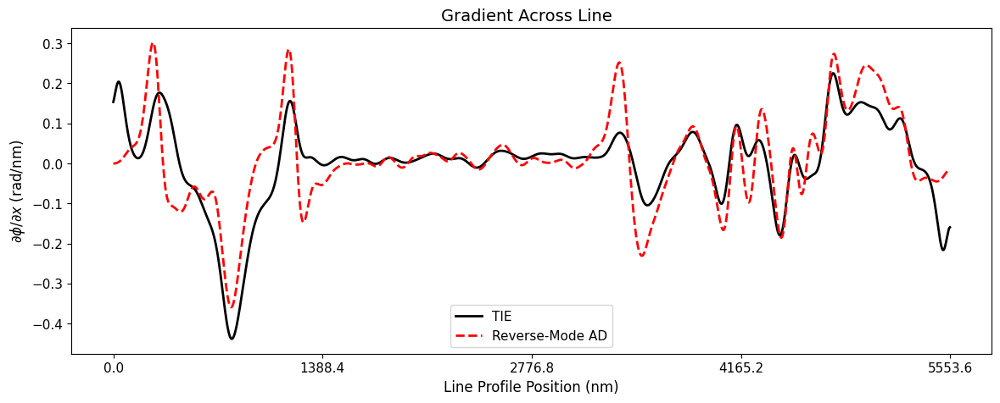

In [193]:
## along the x-direction across the two squares in the center

fig, ax = plt.subplots(figsize=(14,5))
ax.plot(t1[1383,4:2404], 'k-', linewidth=2, label="TIE")
ax.plot(t2[1388,0:2400], "r--", linewidth=2, label="Reverse-Mode AD") #610:1610,360], 'r--', linewidth=2)
ax.legend(loc="lower center")
ax.set_title("Gradient Across Line  ")

ax.set_ylabel(r"$\partial\phi / \partial x$ (rad/nm)")
ax.set_xlabel("Line Profile Position (nm)")
plt.rc("axes", labelsize=12)
plt.rc("axes", titlesize = 14)
plt.rc("legend", fontsize=11)

xticks = np.linspace(0, Nx, 5)
xticklabel = xticks*d_pix

ax.set_xticks(xticks)
ax.set_xticklabels(xticklabel)


plt.savefig("/home/ktrujillo/Lorentz/Kayna/ALTEM/2023_02_07/Cr2_Py16_Cr2/TFS/TIE/500_nano/aligned_imgj/data_analysis_crop_2405_2404/0.0001_LP_line2_y1833_x4-2404.png")

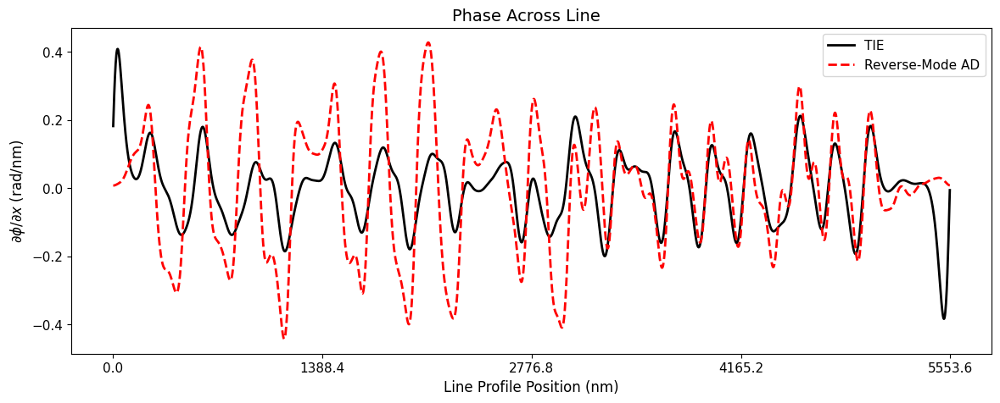

In [194]:
## the first vertical bar at top left (right side - dark purple)

fig, ax = plt.subplots(figsize=(14,5))
ax.plot(tie[381,4:2404], 'k-', linewidth=2, label="TIE")
ax.plot(kp[386,0:2400], 'r--', linewidth=2, label="Reverse-Mode AD")
ax.legend(loc="upper right")
ax.set_title("Phase Across Line  ")

ax.set_ylabel(r"$\partial\phi / \partial x$ (rad/nm)")
ax.set_xlabel("Line Profile Position (nm)")
plt.rc("axes", labelsize=12)
plt.rc("axes", titlesize = 14)
plt.rc("legend", fontsize=11)



xticks = np.linspace(0, Nx, 5)
xticklabel = xticks*d_pix

ax.set_xticks(xticks)
ax.set_xticklabels(xticklabel)


plt.savefig("/home/ktrujillo/Lorentz/Kayna/ALTEM/2023_02_07/Cr2_Py16_Cr2/TFS/TIE/500_nano/aligned_imgj/data_analysis_crop_2405_2404/0.0001_Phase_LP_line1_y381_x4-2404.png")

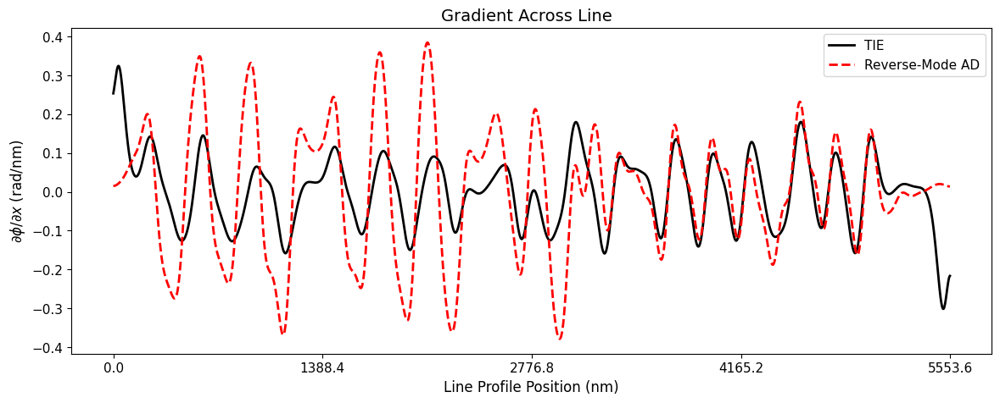

In [195]:
## the first vertical bar at top left (right side - dark purple)

fig, ax = plt.subplots(figsize=(14,5))
ax.plot(t1[381,4:2404], 'k-', linewidth=2, label="TIE")
ax.plot(t2[386,0:2400], 'r--', linewidth=2, label="Reverse-Mode AD")
ax.legend(loc="upper right")
ax.set_title("Gradient Across Line  ")

ax.set_ylabel(r"$\partial\phi / \partial x$ (rad/nm)")
ax.set_xlabel("Line Profile Position (nm)")
plt.rc("axes", labelsize=12)
plt.rc("axes", titlesize = 14)
plt.rc("legend", fontsize=11)



xticks = np.linspace(0, Nx, 5)
xticklabel = xticks*d_pix

ax.set_xticks(xticks)
ax.set_xticklabels(xticklabel)


plt.savefig("/home/ktrujillo/Lorentz/Kayna/ALTEM/2023_02_07/Cr2_Py16_Cr2/TFS/TIE/500_nano/aligned_imgj/data_analysis_crop_2405_2404/0.0001_LP_line1_y381_x4-2404.png")

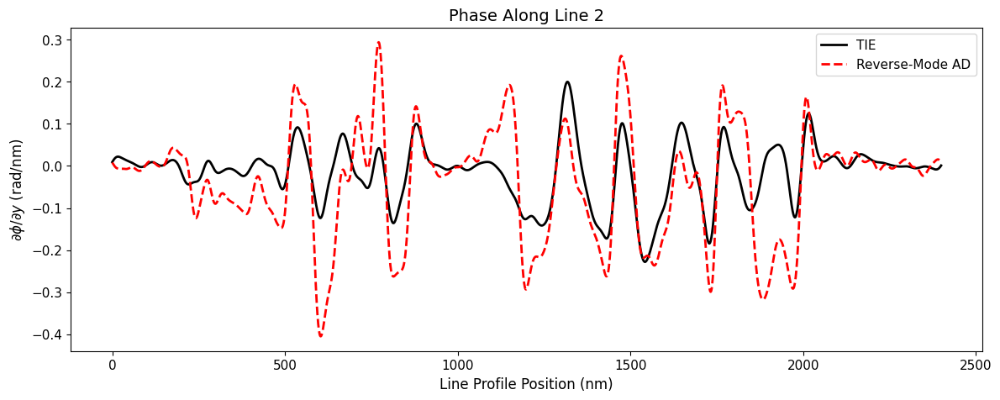

In [207]:
## along three squares down y-axis

fig, ax = plt.subplots(figsize=(14,5))
ax.plot(tie[0:2400,1553], 'k-', linewidth=2, label="TIE")
ax.plot(kp[5:2405,1557], 'r--', linewidth=2, label="Reverse-Mode AD")
ax.legend(loc="upper right")
ax.set_title("Phase Along Line 2")

ax.set_ylabel(r"$\partial\phi / \partial y$ (rad/nm)")
ax.set_xlabel("Line Profile Position (nm)")
plt.rc("axes", labelsize=12)
plt.rc("axes", titlesize = 14)
plt.rc("legend", fontsize=11)



# xticks = np.linspace(0, Nx, 5)
# xticklabel = xticks*d_pix

# ax.set_xticks(xticks)
# ax.set_xticklabels(xticklabel)


plt.savefig("/home/ktrujillo/Lorentz/Kayna/ALTEM/2023_02_07/Cr2_Py16_Cr2/TFS/TIE/500_nano/aligned_imgj/data_analysis_crop_2405_2404/0.0001_Phase_LP_line4_y1000-2000_x1553.png")

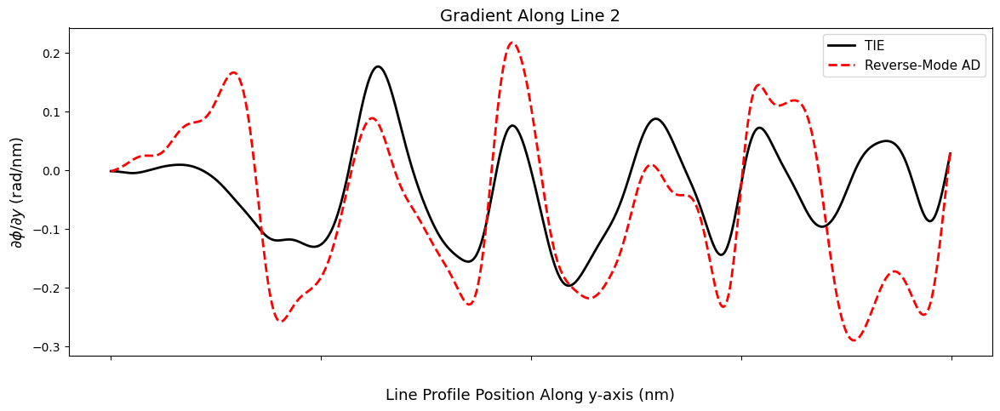

In [87]:
## along three squares down y-axis

fig, ax = plt.subplots(figsize=(14,5))
ax.plot(t1[1000:2000,1553], 'k-', linewidth=2, label="TIE")
ax.plot(t2[1005:2005,1557], 'r--', linewidth=2, label="Reverse-Mode AD")
ax.legend(loc="upper right")
ax.set_title("Gradient Along Line 2")

ax.set_ylabel(r"$\partial\phi / \partial y$ (rad/nm)")
ax.set_xlabel("Line Profile Position Along y-axis (nm)")
plt.rc("axes", labelsize=13)
plt.rc("axes", titlesize = 14)
plt.rc("legend", fontsize=11)

xticks = np.linspace(0, 1000, 5)
xticklabel = ("")
# xticks = np.linspace(0, Nx/5, 5)
# xticklabel = xticks*d_pix

ax.set_xticks(xticks)
ax.set_xticklabels(xticklabel)
ax.xaxis.labelpad=20

#plt.savefig("/home/ktrujillo/Lorentz/Kayna/ALTEM/2023_02_07/Cr2_Py16_Cr2/TFS/TIE/500_nano/aligned_imgj/data_analysis_crop_2405_2404/0.0001_LP_line4_y1000-2000_x1553_noxticks_pad20.png")

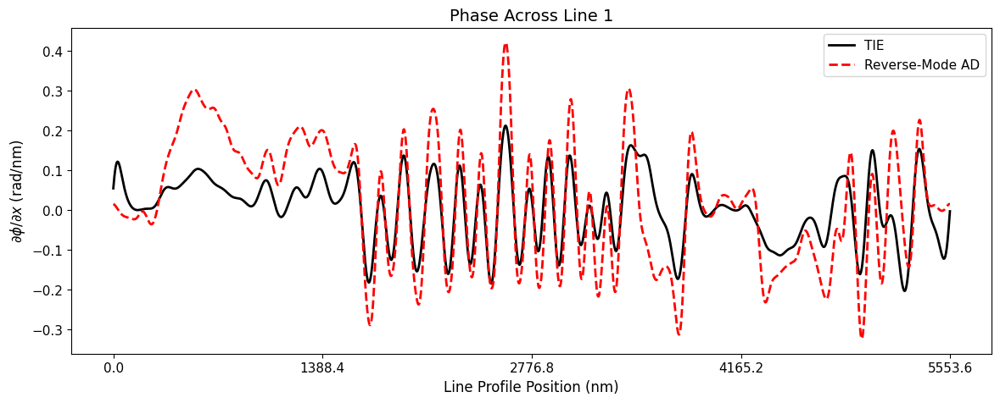

In [ ]:
# across smallest features (AFM) full 

fig, ax = plt.subplots(figsize=(14,5))
ax.plot(tie[1929,4:2404], 'k-', linewidth=2, label="TIE")
ax.plot(kp[1934,0:2400], 'r--', linewidth=2, label="Reverse-Mode AD")
ax.legend(loc="upper right")
ax.set_title("Phase Across Line 1")

ax.set_ylabel(r"$\partial\phi / \partial x$ (rad/nm)")
ax.set_xlabel("Line Profile Position (nm)")
plt.rc("axes", labelsize=12)
plt.rc("axes", titlesize = 14)
plt.rc("legend", fontsize=11)


xticks = np.linspace(0, Nx, 5)
xticklabel = xticks*d_pix

ax.set_xticks(xticks)
ax.set_xticklabels(xticklabel)


plt.savefig("/home/ktrujillo/Lorentz/Kayna/ALTEM/2023_02_07/Cr2_Py16_Cr2/TFS/TIE/500_nano/aligned_imgj/data_analysis_crop_2405_2404/0.0001_Phase_LP_line3_y1929_x4-2404.png")

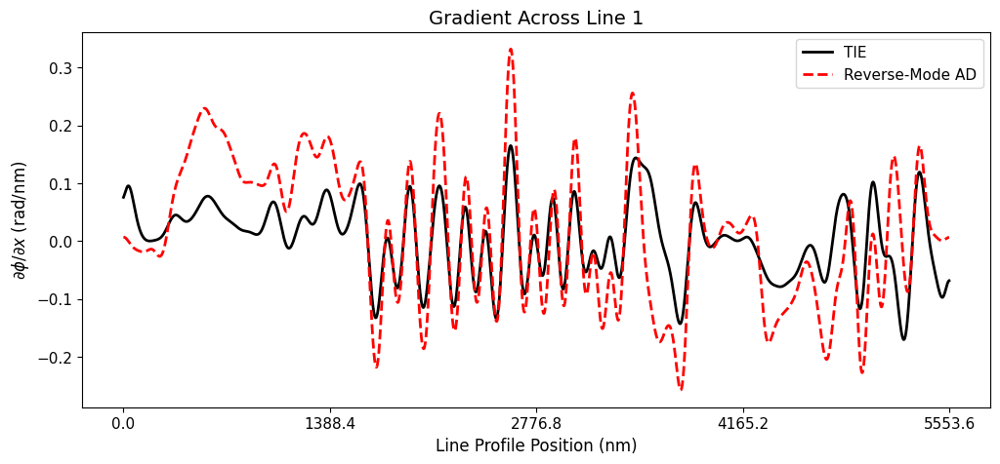

In [218]:
# across smallest features (AFM) full 

fig, ax = plt.subplots(figsize=(12,5))
ax.plot(t1[1929,4:2404], 'k-', linewidth=2, label="TIE")
ax.plot(t2[1934,0:2400], 'r--', linewidth=2, label="Reverse-Mode AD")
ax.legend(loc="upper right")
ax.set_title("Gradient Across Line 1")

ax.set_ylabel(r"$\partial\phi / \partial x$ (rad/nm)")
ax.set_xlabel("Line Profile Position (nm)")
plt.rc("axes", labelsize=12)
plt.rc("axes", titlesize = 14)
plt.rc("legend", fontsize=11)


xticks = np.linspace(0, Nx, 5)
xticklabel = xticks*d_pix

ax.set_xticks(xticks)
ax.set_xticklabels(xticklabel)


plt.savefig("/home/ktrujillo/Lorentz/Kayna/ALTEM/2023_02_07/Cr2_Py16_Cr2/TFS/TIE/500_nano/aligned_imgj/data_analysis_crop_2405_2404/0.0001_LP_line3_y1929_x4-2404.png")

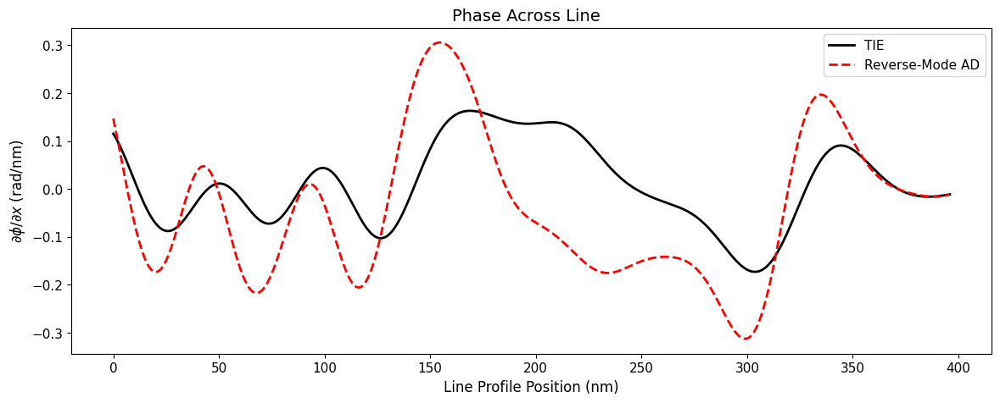

In [200]:
## across smallest size features (3 bars and 1 square) from AFM msmts

fig, ax = plt.subplots(figsize=(14,5))
ax.plot(tie[1929,1250:1716], 'k-', linewidth=2, label="TIE")
ax.plot(kp[1934,1254:1720], 'r--', linewidth=2, label="Reverse-Mode AD")
ax.legend(loc="upper right")
ax.set_title("Phase Across Line  ")

ax.set_ylabel(r"$\partial\phi / \partial x$ (rad/nm)")
ax.set_xlabel("Line Profile Position (nm)")
plt.rc("axes", labelsize=12)
plt.rc("axes", titlesize = 14)
plt.rc("legend", fontsize=11)

# xticks = np.linspace(0, Nx, 5)
# xticklabel = xticks*d_pix

# ax.set_xticks(xticks)
# ax.set_xticklabels(xticklabel)



plt.savefig("/home/ktrujillo/Lorentz/Kayna/ALTEM/2023_02_07/Cr2_Py16_Cr2/TFS/TIE/500_nano/aligned_imgj/data_analysis_crop_2405_2404/0.0001_Phase_LP_line5_y1929_x1319-1716.png")

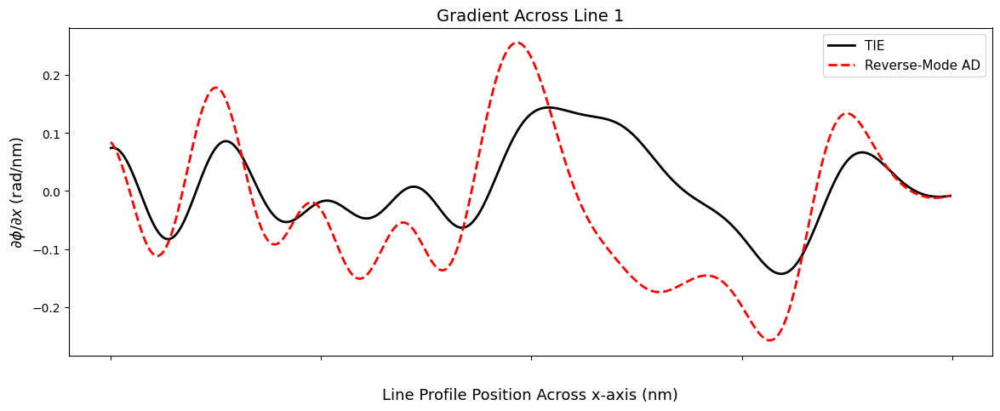

In [85]:
## across smallest size features (3 bars and 1 square) from AFM msmts

fig, ax = plt.subplots(figsize=(14,5))
ax.plot(t1[1929,1250:1716], 'k-', linewidth=2, label="TIE")
ax.plot(t2[1934,1254:1720], 'r--', linewidth=2, label="Reverse-Mode AD")
ax.legend(loc="upper right")
ax.set_title("Gradient Across Line 1")

ax.set_ylabel(r"$\partial\phi / \partial x$ (rad/nm)")
ax.set_xlabel("Line Profile Position Across x-axis (nm)")
plt.rc("axes", labelsize=13)
plt.rc("axes", titlesize = 14)
plt.rc("legend", fontsize=11)


xticks = np.linspace(0, 466, 5)
xticklabel = ("")
# xticks = np.linspace(0, Nx/5, 5)
# xticklabel = xticks*d_pix

ax.set_xticks(xticks)
ax.set_xticklabels(xticklabel)

ax.xaxis.labelpad=20


plt.savefig("/home/ktrujillo/Lorentz/Kayna/ALTEM/2023_02_07/Cr2_Py16_Cr2/TFS/TIE/500_nano/aligned_imgj/data_analysis_crop_2405_2404/0.0001_LP_line5_y1929_x1250-1716_noticks_pad20.png")

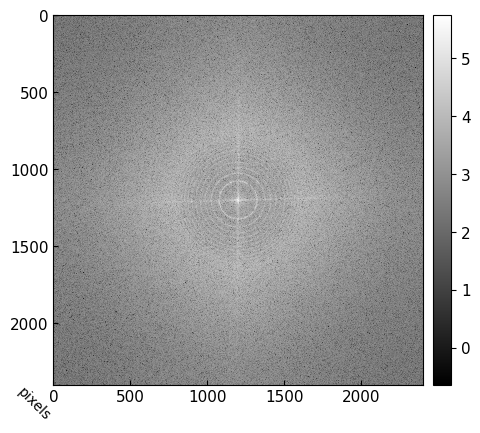

In [202]:
show_im(np.log10(np.abs(fftp)))

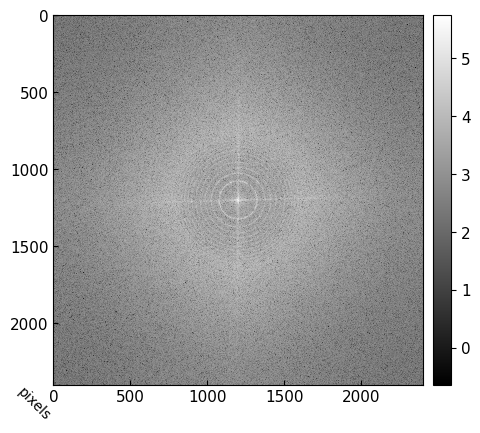

In [203]:
def show_fft(fft, title=None, **kwargs):
    """Display the log of the abs of a FFT

    Args:
        fft (ndarray): 2D image
        title (str, optional): title of image. Defaults to None.
        **kwargs: passed to show_im()
    """
    fft = np.copy(fft)
    nonzeros = np.nonzero(fft)
    fft[nonzeros] = np.log10(np.abs(fft[nonzeros]))
    fft = fft.real
    show_im(fft, title=title, **kwargs)

show_fft(fftp)